# Проектная работа "Рынок заведений общественного питания Москвы"

# Оглавление

## Цели и задачи проекта: 

- подготовить исследование рынка Москвы 
- найти интересные особенности
- презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места

## План работы:
1. Изучить общую информацию
2. Выполнить предобработку данных
3. Анализ данных:
- Выявить категории заведений.
- Исследование количество посадочных мест в местах по категориям.
- Найти соотношение сетевых и несетевых заведений в датасете.
- Найти частые сетевые заведения.
- Выявить топ-15 популярных сетей в Москве.
- Определить административные районы Москвы в датасете.
- Отразить распределение средних рейтингов по категориям заведений.
- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
- Отобразите все заведения датасета на карте с помощью кластеров.
- Найдите топ-15 улиц по количеству заведений.
- Найти улицы, на которых находится только один объект общепита. 
- Изучить размер средних чеков в заказах относительно районов.
- Проиллюстрировать другие взаимосвязи.
- Общий вывод.

4. Детализирование исследования.
- Определить количество кофеен и особенности их расположения.
- Определить наличие круглосуточных кафе.
- Найти распределение рейтингов кофеен по районам.
- Вычислить стоимость чашки капучино для новой кофейни.
- Построить визуализацию.

5. Подготовить презентацию.

## Шаг 0. Подключение библиотек

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import json
from folium import Marker, Map
import seaborn as sns
from numpy import median
from folium import Map, Choropleth
from folium.plugins import MarkerCluster

## Шаг 1. Загрузим данные и изучим общую информацию

In [3]:
data = pd.read_csv("C:\\Users\\alekl\\Documents\\Практикум\\moscow_places.csv")
data.info()
data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Смотрим на типы данных в датасете. 
Всего в таблице 8406 кофеен и 14 столбов-показателй. 
Столбцы `name`, `category`, `address`, `district, hours`, `price`, `avg_bill` имеют тип данных object.
Столбцы `lat`, `lng`, `rating`, `middle_avg_bill`, `middle_coffee_cup`, `seats` с типом данных float64. И столбец `chain` имеет тип данных int64.
Есть пропуски в столбцах `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`. Дальше остановимся на них более подробно.

## Шаг 2. Выполним предобработку данных

1. Проверяем данные на наличие дубликатов. Видим, что явных дубликатов нет.

In [4]:
data.duplicated().sum()

0

1.1 Проверим наличие неявных дубликатов.

In [5]:
# приведем название заведений к нижнему регистру
data['name'] = data['name'].str.lower()

# проверим на дубликаты и удалим их
data['is_duplicate'] = data.duplicated(['name', 'address'], keep=False)
data = data.drop_duplicates(['name', 'address'], keep='first')
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicate
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,False
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,False
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,False
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,False


2. Посмотрим, в каких столбцах есть пропуски и можно ли с ними что-нибудь сделать.
Видим, что пропуски есть в столбцах `hourse`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`. 

In [6]:
# смотрим сколько пропусков в датасете
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
is_duplicate            0
dtype: int64

Оставляем пропуски без изменений

3. Создаем столбец `street` с названиями улиц из столбца с адресом.

In [7]:
data = pd.DataFrame(data)

# функция для извлечения названия улицы
def street(address):
    
# разделение адреса по запятым
    parts = address.split(',')
    street = parts[1].strip()
    return street

# применение функции к столбцу address и создание нового столбца street_name
data['street'] = data['address'].apply(street)
data['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8403, dtype: object

4. Создаем столбец `is_24_7_daily` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [8]:
data = pd.DataFrame(data)

# заменим значения NaN на пустые строки
data['hours'] = data['hours'].fillna('')

# функция для проверки наличия слова "круглосуточно"
def all_time(hours):
    return 'ежедневно, круглосуточно' in hours

# применим функцию к столбцу hours и создание нового столбца is_24_7
data['is_24_7_daily'] = data['hours'].apply(all_time)

# выделим строки, содержащие слово "круглосуточно"
result = data[data['is_24_7_daily']]
result

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicate,street,is_24_7_daily
10,great room bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,False,Левобережная улица,True
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,False,Ленинградское шоссе,True
19,пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,False,Ижорский проезд,True
24,drive café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,False,улица Дыбенко,True
49,2u-ту-ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN,False,Ижорская улица,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,намангале,кафе,"Москва, Ферганская улица, вл17-21",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,NaN,NaN,NaN,NaN,0,NaN,False,Ферганская улица,True
8399,"пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0,False,Болотниковская улица,True
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,False,Люблинская улица,True
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,False,Люблинская улица,True


## Шаг 3. Анализ данных

**1. Определяем категории заведений.**

In [9]:
# cмотрим, какие есть типы заведений
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

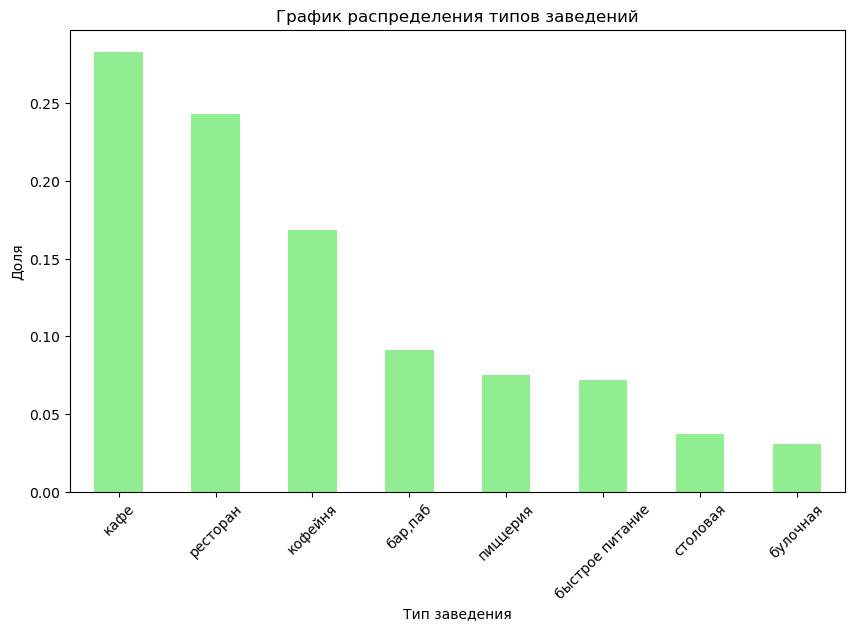

In [10]:
# найдем долю категорий от общего числа
count = data['category'].value_counts()
part_count = count/count.sum()

# сортируем по доле
part_count = part_count.sort_values(ascending=False)

# строим столбчатую диаграмму
plt.figure(figsize=(10, 6))
part_count.plot(kind='bar', color='lightgreen')
plt.title('График распределения типов заведений')
plt.xlabel('Тип заведения')
plt.ylabel('Доля')
plt.xticks(rotation=45)
plt.show()

Видим, что преобладают кафе, на втором месте рестораны и меньше всего булочных.

**2. Проанализируем количество посадочных мест в зависимости от заведения.**

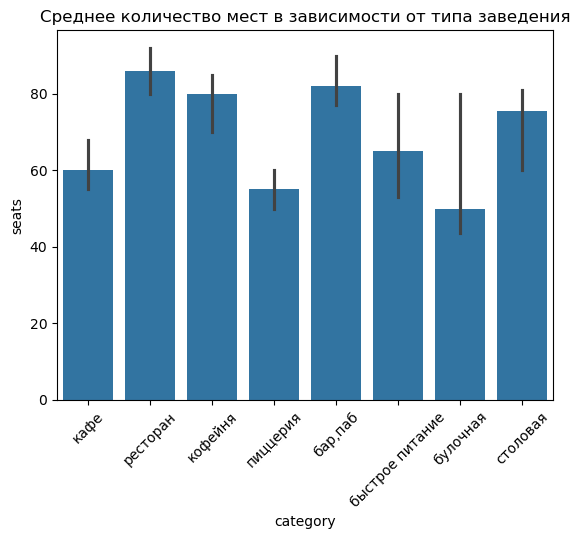

In [11]:
df = pd.DataFrame(data)

# группируем заведения по типу и находим среднее количество мест
average_seats = df.groupby('category')['seats'].mean()

# строим столбчатую диаграмму
sns.barplot(x='category', y='seats', data=data, estimator=median)
plt.xticks(rotation=45)
plt.title('Среднее количество мест в зависимости от типа заведения')
plt.show()

По найденным данным делаем вывод, что меньше всего посадочных мест имеют булочные и пиццерии (около 50-60). Больше всего мест у баров/пабов и ресторанов (около 80-90). Это обусловлено тем, что булочные и пиццерии все же больше относятся к быстрому питанию, а в барах и ресторанах люди проводят обычно намного больше времени.

**3. Рассмотрим соотношение сетевых и несетевых заведений в датасете.**

In [12]:
# подсчитаем количество сетевых и несетевых заведений, где 0 - это несетевое и 1 - сетевое
data['chain'].value_counts()

chain
0    5200
1    3203
Name: count, dtype: int64

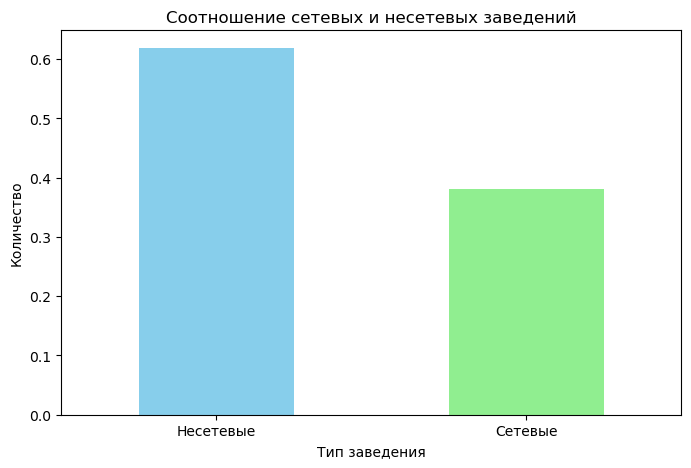

In [13]:
# подсчитаем количество сетевых и несетевых заведений
network_counts = data['chain'].value_counts()

# найдем долю сетевых и несетевых заведений от общего количества
part_network = network_counts/network_counts.sum()

# визуализируем результаты
plt.figure(figsize=(8, 5))
part_network.plot(kind='bar', color=['skyblue', 'lightgreen'])
plt.title('Соотношение сетевых и несетевых заведений')
plt.xlabel('Тип заведения')
plt.ylabel('Количество')
plt.xticks(ticks=[0, 1], labels=['Несетевые', 'Сетевые'], rotation=0)
plt.show()

Несетевых заведений почти в 2 раза больше, чем сетевых.

 **4. Определим, какие категории заведений чаще являются сетевыми.**

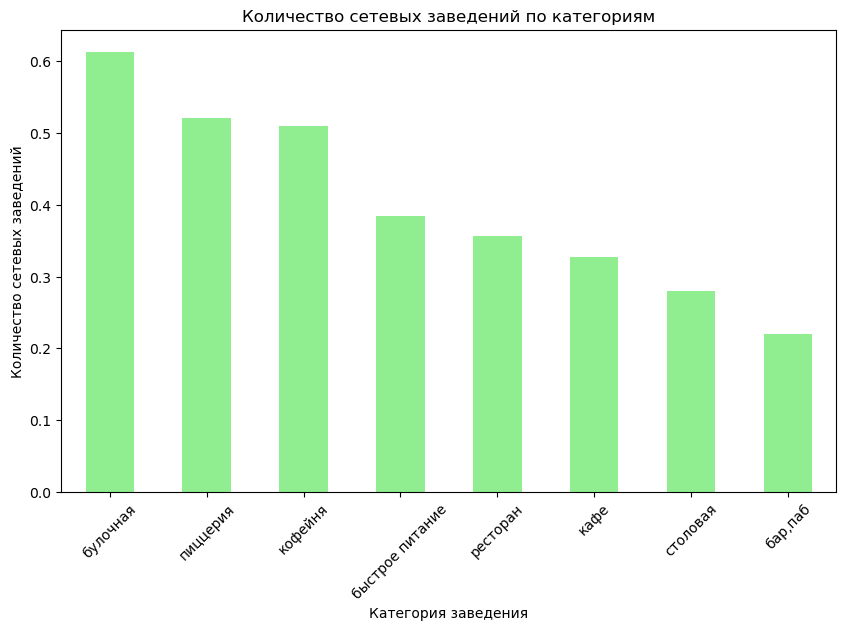

In [14]:
# группируем заведения по типу и находим количество сетевых
network_counts = df[df['chain'] == 1]['category'].value_counts()

# находим долю сетевых заведений от общего количества
part = network_counts/data['category'].value_counts()

# сортируем по доле
part = part.sort_values(ascending=False)

# строим столбчатую диаграмму
plt.figure(figsize=(10, 6))
part.plot(kind='bar', color='lightgreen')
plt.title('Количество сетевых заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество сетевых заведений')
plt.xticks(rotation=45)
plt.show()

Больше всего сетевых заведений в категории булочных, меньше всего - бары/пабы.

**5. Найдем топ-15 популярных сетей в Москве.**

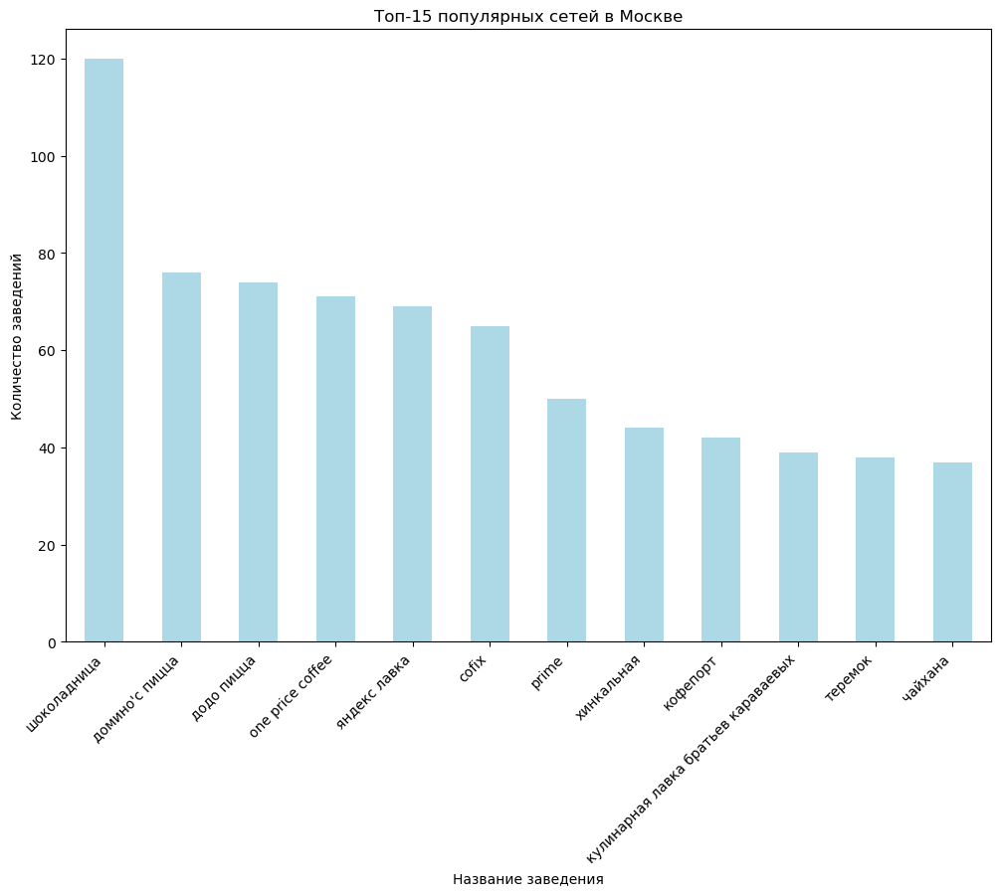

In [15]:
# найдем топ-15 сетевых заведений Москвы
top = data['name'].value_counts().head(15)
filtered_data = data[data['name'].isin(top.index) & (data['chain'] == 1)]
filtered_data = filtered_data['name'].value_counts()

# сортируем данные
filtered_data = filtered_data.sort_values(ascending=False)

# построим график распределения кофеен по популярности
plt.figure(figsize=(12, 8))
filtered_data.plot(kind='bar', color='lightblue')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Название заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.show()

Как видим на графике лидирует кафе "Шоколадница". Остальные заведения не менее популярны и тоже пользуются спросом. Эти места объединяет быстрота обслуживания, разнообразное меню и хорошее соотношение цена/качество. Потребитель может как попить здесь чашечку кофе и быстро съесть ланч, так и посидеть с колегами или друзьями более длительное время. Эти параметры вполне могут объяснить популярность этих сетей. Исключение составляет Яндекс.Лавка, но она также может быть популярна из-за быстроты и разноообразия.

**6. Отобразите общее количество заведений и количество заведений каждой категории по районам**

In [16]:
# считаем общее количество заведений по районам
total_counts = data['district'].value_counts()
total_counts

district
Центральный административный округ         2242
Северный административный округ             899
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

Наибольшее количество заведений расположено в Центральном районе. Наименьшее - в Северо-Западном.

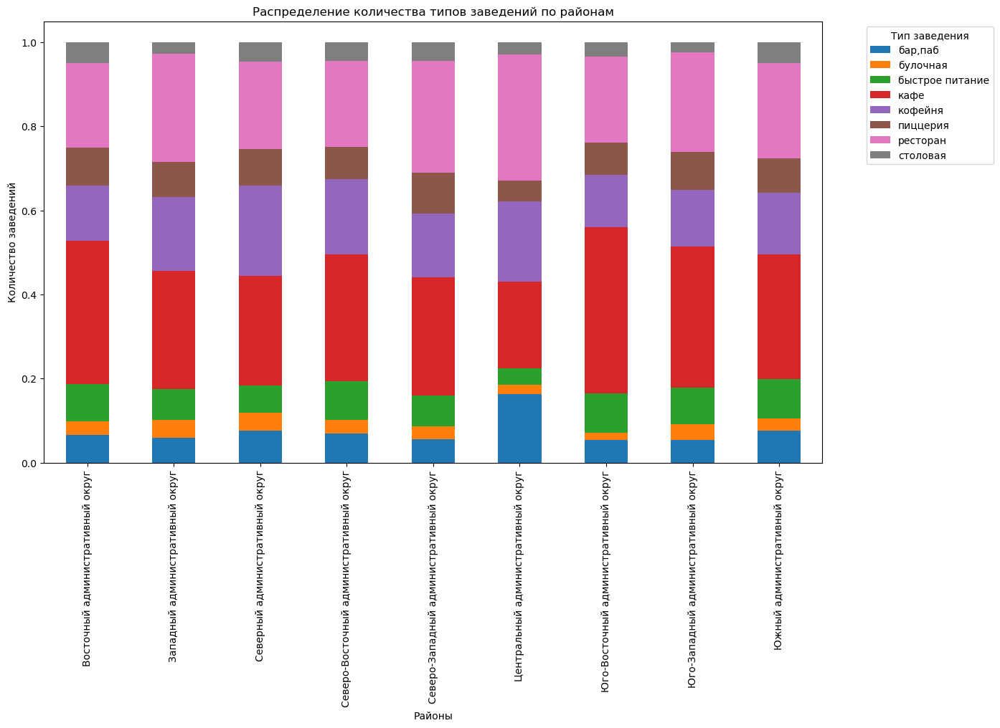

In [17]:
# построим сводную таблицу
pivot_table = pd.crosstab(data['district'], data['category'])

# рассчитываем общие суммы для каждого района
row_sums = pivot_table.sum(axis=1)

# рассчитываем доли
percentage_table = pivot_table.div(row_sums, axis=0)

# построим график
percentage_table.plot(kind='bar', stacked=True, figsize=(14, 8))

plt.xlabel('Районы')
plt.ylabel('Количество заведений')
plt.title('Распределение количества типов заведений по районам')
plt.xticks(rotation=90)
plt.legend(title='Тип заведения', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

В Центральном районе лидируют рестораны, а в Северо-Западном - рестораны и кафе. Также можно увидеть распределение долей по остальным районам.

**7. Визуализируем распределение средних рейтингов по категориям заведений.**

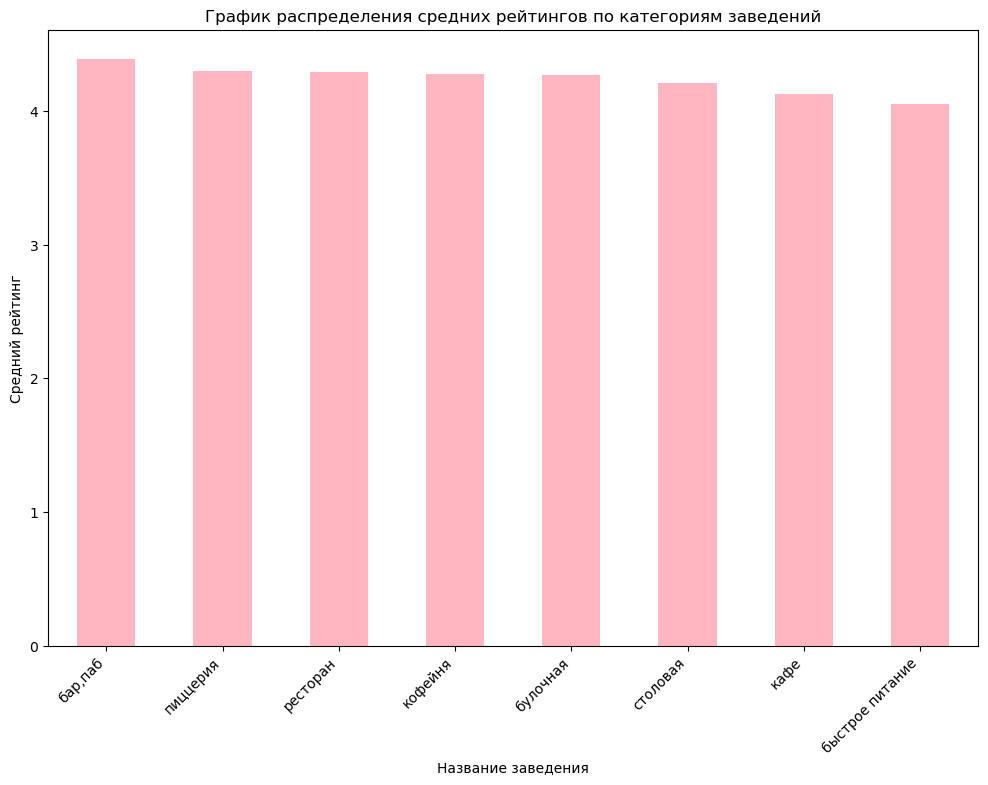

In [18]:
# смотрим на распределение среднего рейтинга по типу заведения
avg_rating = data.groupby('category')['rating'].mean()
avg_rating

# сортируем данные
avg_rating = avg_rating.sort_values(ascending=False)

# визуализируем данные
plt.figure(figsize=(12, 8))
avg_rating.plot(kind='bar', color='lightpink')
plt.title('График распределения средних рейтингов по категориям заведений')
plt.xlabel('Название заведения')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=45, ha='right')
plt.show()

У всех категорий средний уровень рейтинга примерно одинаковый. Немного отстают заведения быстрого питания.

**8. Построим фоновую картограмму со средним рейтингом заведений каждого района.**

In [19]:
# построим средний рейтинг заведений по округам Москвы
rating_dist = data.groupby('district')['rating'].mean()
rating_dist

district
Восточный административный округ           4.174185
Западный административный округ            4.181647
Северный административный округ            4.239822
Северо-Восточный административный округ    4.147978
Северо-Западный административный округ     4.208802
Центральный административный округ         4.377520
Юго-Восточный административный округ       4.101120
Юго-Западный административный округ        4.172920
Южный административный округ               4.184417
Name: rating, dtype: float64

Все округа имеют примерно одинаковый рейтинг.

In [25]:
# загружаем JSON-файл с границами округов Москвы
state_geo = "C:\\Users\\alekl\\Documents\\Практикум\\admin_level_geomap.geojson"

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Видим, что самый высокий рейтинг заведений имеет Центральный округ.

**9. Отобразим все заведения датасета на карте с помощью кластеров.**

In [26]:
# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_clusters(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)
    
# выводим карту
m

Отобразили все заведения датасета на карте с помощью кластеров. Как видим на карте, Москва не страдает дефицитом мест общественного питания.

**10. Опрелеляем топ-15 улиц по количеству заведений.**

In [27]:
# подсчитаем количество заведений на каждой улице
street_counts = data['street'].value_counts()

# найдем топ-15
street_counts.head(15)

street
проспект Мира             183
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: count, dtype: int64

Наибольшее количество заведений находится на проспекте Мира.

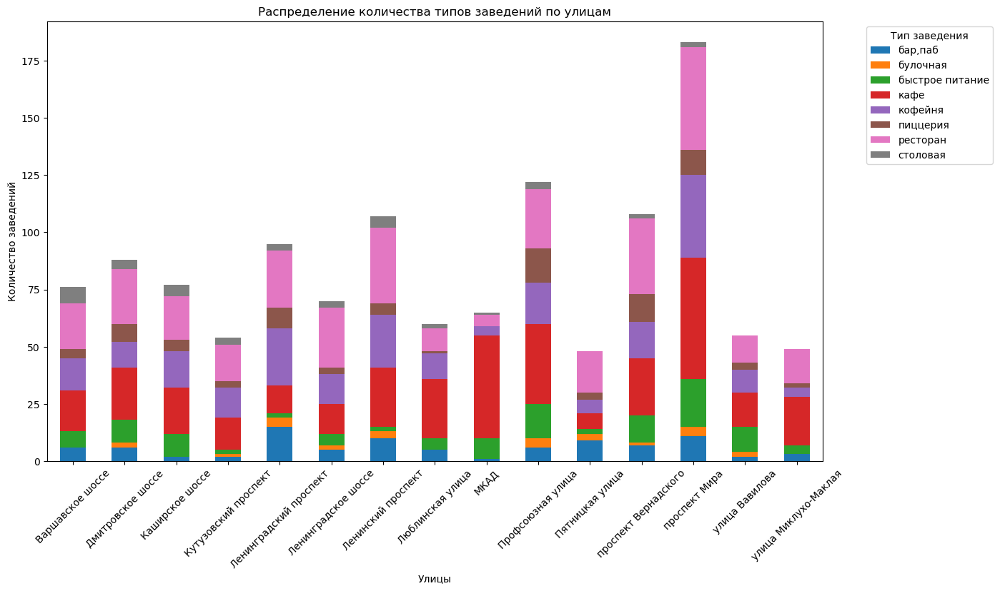

In [29]:
# найдем топ-15 улиц
top_streets = data['street'].value_counts().head(15).index
filtered_data = data[data['street'].isin(top_streets)]

# построим сводную таблицу
pivot_table = pd.crosstab(filtered_data['street'], filtered_data['category'])


# построим график
pivot_table.plot(kind='bar', stacked=True, figsize=(14, 8))

plt.xlabel('Улицы')
plt.ylabel('Количество заведений')
plt.title('Распределение количества типов заведений по улицам')
plt.xticks(rotation=45)
plt.legend(title='Тип заведения', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

Наибольшее количество заведений находится на проспекте Мира и преобладает тип "Кафе".

**11. Находим улицы, на которых находится только одно заведение.**

In [30]:
one = street_counts[street_counts == 1].index
filtered_data = data[data['street'].isin(one)]

У заведенеий нет общего объединяющего принципа.

**11. Проанализируем средние чеки в заведениях по районам.**

In [31]:
# найдем средний чек заведений по районам и округлим значения
avg_check_dist = data.groupby('district')['middle_avg_bill'].median().round()
avg_check_dist

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         600.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

Самый высокий средний чек имеет Центральный и Западный округи, а самый низкий - Юго-Восточный.

In [32]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_check_dist,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек в заведениях по районам',
).add_to(m)

# выводим карту
m

Самый дорогим районом по среднему чеку в заведениях оказался Центральный административный район. На втором месте стоит Западный округ.

**Вывод:**

Мы проанализировали заведения в Москве и выяснили:  
    - какие типы заведений преобладают  
    - зависимость распределения количества мест от типа заведения  
    - отношение сетевых завеедений к несетевым  
    - определили топ-15 популярных заведений в Москве  
    - выяснили распределение типов заведений по районам   
    - визуально увидели распределние заведений на карте Москвы  
    - узнали распределние завеедний по улицам города  
    - проанализировали средний чек  
    
Из всех этих данных делаем вывод, что в Москве преобладают кафе, на втором месте рестораны и меньше всего в городе сетей быстрого питания. Меньше всего посадочных мест имеют  булочные и пиццерии (50 - 60). Больше всего мест у баров/пабов и ресторанов (около 80-90). Преобладают сетевые места в категории "булочные". Самым популярным местом является "Шоколадница".

Согласно данным, наибольшее число заведений располагается в Центральном административном округе, 2242 заведения. Наименьшее число - в Северо-Западном округе. У всех категорий средний уровень рейтинга примерно одинаковый. Из округов самый высокий рейтинг заведений имеет Центральный округ, самый низкий - Юго-Восточный.  
Наибольшее количество заведений находится на проспекте Мира и преобладает тип "Кафе".

## Шаг 4. Детализируем исследование: открытие кофейни

In [33]:
# находим количество кофеен  датасете
coffee_house_count = data[data['category'] == 'кофейня'].shape[0]
coffee_house_count

1413

Видим, что всего в датасете 1413 кофеен.

In [34]:
# в каких районах больше всего кофеен
district_counts = data[data['category'] == 'кофейня']['district'].value_counts()
district_counts

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: count, dtype: int64

Больше всего кофеен в Центральном районе.

In [35]:
# строим карту Центрального района
center_lat, center_lng = 55.7558, 37.6176
central_district = data[data['district'] == 'Центральный административный округ']

# создаём карту центра Москвы
center = Map(location=[center_lat, center_lng], zoom_start=10)

# создаем кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(center)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_cluster(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['district'] == 'Центральный административный округ'}"
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
central_district.apply(create_cluster, axis=1)

# выводим карту
center

Видим, что меньше всего заведений на западе центрального округа. При открытии места можем рассматривать этот кусочек Москвы.

In [36]:
# смотрим наличие круглосуточных кофеен
coffee_house_count = data[data['category'] == 'кофейня']
open_24 = coffee_house_count[coffee_house_count['hours'] == 'ежедневно, круглосуточно']
open_24.shape[0]

59

Их достаточно много - 59 штук.

In [37]:
# смотрим на рейтинги кофеен
cofffee_house_rating = coffee_house_count[['name', 'rating']]
cofffee_house_rating

,name,rating
3,dormouse coffee shop,5.0
25,в парке вкуснее,4.3
45,9 bar coffee,4.0
46,cofefest,3.6
52,cofix,3.8
...,...,...
8356,назис пури,4.5
8365,квадрат кофе,4.2
8376,шоколад имбирь корица,4.1
8385,cafio,4.7


In [38]:
# смотрим на распределение рейтингов по районам
district_ratings = coffee_house_count.groupby(['district', 'name'])['rating'].mean().reset_index()
district_ratings.round()

,district,name,rating
0,Восточный административный округ,18 грамм,4.0
1,Восточный административный округ,5 stars coffee,4.0
2,Восточный административный округ,9 bar coffee,4.0
3,Восточный административный округ,arabix,5.0
4,Восточный административный округ,bassg,4.0
...,...,...,...
1000,Южный административный округ,чайхана уч кудук,4.0
1001,Южный административный округ,человек и кофе,5.0
1002,Южный административный округ,шеf пончик,4.0
1003,Южный административный округ,шоколадница,4.0


Ответим на вопрос "На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?"

In [50]:
# Вычисляем среднюю стоимость капучино по районам
average_cappuccino_price_by_district = (
    coffee_house_count
    .groupby('district', as_index=False)  # Группируем по районам
    ['middle_coffee_cup']
    .mean()  # Среднее значение
    .round()  # Округление до целых
    .rename(columns={'middle_coffee_cup': 'avg_cappuccino_price'})  # Переименовываем столбец
)
average_cappuccino_price_by_district

                                  district  avg_cappuccino_price
0         Восточный административный округ                 174.0
1          Западный административный округ                 190.0
2          Северный административный округ                 166.0
3  Северо-Восточный административный округ                 165.0
4   Северо-Западный административный округ                 166.0
5       Центральный административный округ                 188.0
6     Юго-Восточный административный округ                 151.0
7      Юго-Западный административный округ                 184.0
8             Южный административный округ                 158.0


Самая дорогая средняя стоимость чашки в Западном округе - 190 руб, а самая низкая в Юго-Восточном - 151 руб.

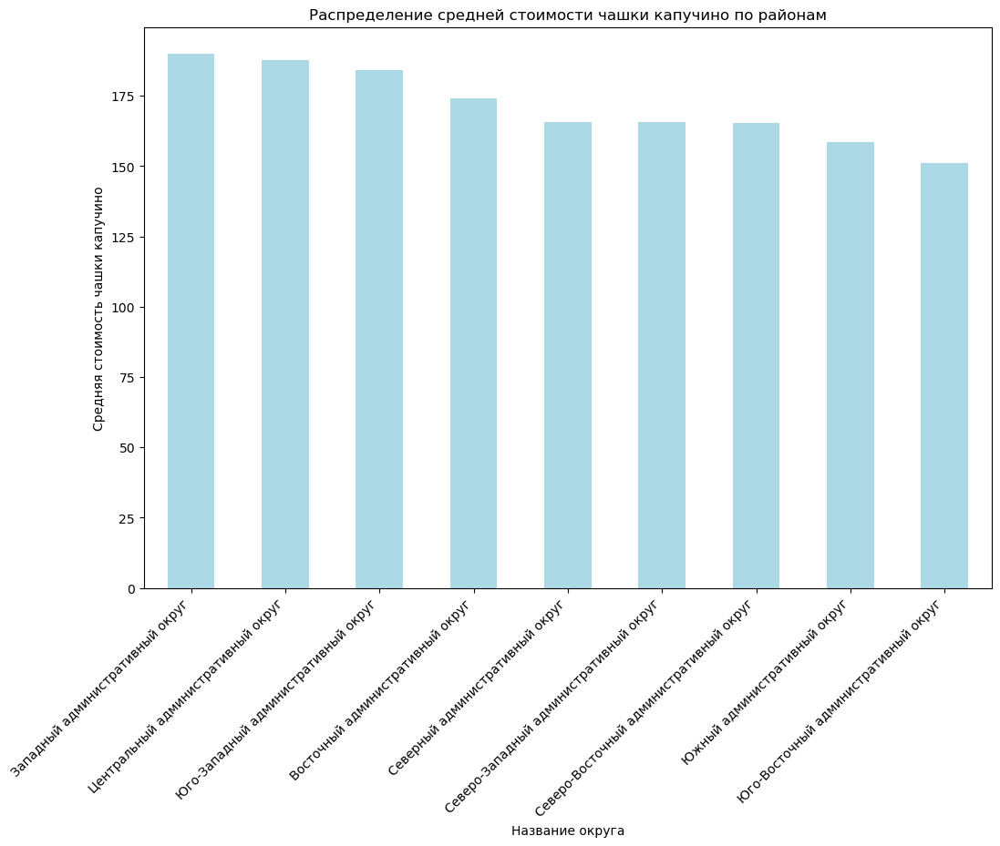

In [40]:
# найдем среднюю стоимость чашки кофе по районам
average_cappuccino_price_by_district = coffee_house_count.groupby(['district'])['middle_coffee_cup'].mean()

# отсортируем данные
average_cappuccino_price_by_district  = average_cappuccino_price_by_district.sort_values(ascending = False)

# построим график
plt.figure(figsize=(12, 8))
average_cappuccino_price_by_district.plot(kind='bar', color='lightblue')
plt.title('Распределение средней стоимости чашки капучино по районам')
plt.xlabel('Название округа')
plt.ylabel('Средняя стоимость чашки капучино')
plt.xticks(rotation=45, ha='right')
plt.show()

В зависимости от района, где будут открывать кофейню надо учитывать средние цены в этих районах.

**Визуализации. Рекомендации для открытия нового кафе**

In [41]:
# выведем таблицу со всеми кофейнями
coffee_house_count

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_duplicate,street,is_24_7_daily,cappuccino
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица Маршала Федоренко,False,175.055662
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,False,парк Левобережный,False,175.055662
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,False,Коровинское шоссе,False,175.055662
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,False,улица Маршала Федоренко,False,175.055662
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,False,улица Дыбенко,False,175.055662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,False,Люблинская улица,False,175.055662
8365,квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,False,Волгоградский проспект,False,175.055662
8376,шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,False,Грайвороновская улица,False,175.055662
8385,cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,False,Новохохловская улица,False,175.055662


1. В каком районе лучше всего открыть кофейню.

In [42]:
# посмотрим на наличие кофеен по округам
coffee_house_count['district'].value_counts()

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: count, dtype: int64

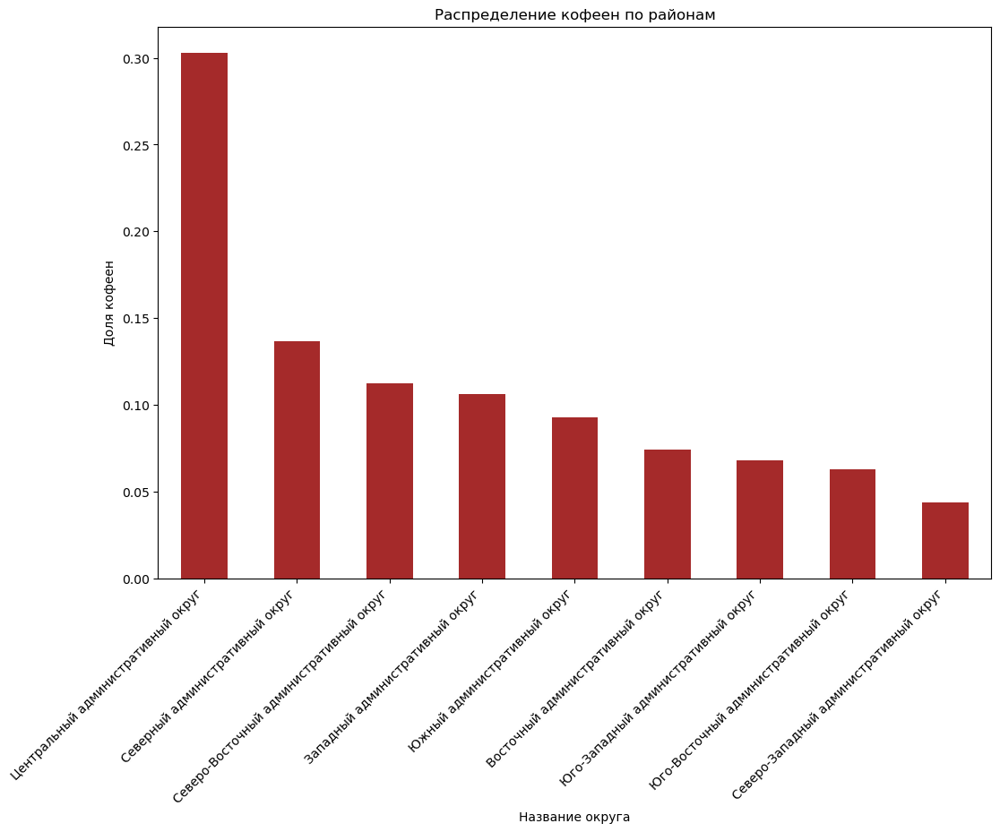

In [43]:
# считаем общее количество районов
total_counts = coffee_house_count['district'].value_counts()
part_cofee_house = total_counts/total_counts.sum()

# отсортируем данные
part_cofee_house=part_cofee_house.sort_values(ascending=False)

# визуализируем результаты
plt.figure(figsize=(12, 8))
part_cofee_house.plot(kind='bar', color='brown')
plt.title('Распределение кофеен по районам')
plt.xlabel('Название округа')
plt.ylabel('Доля кофеен')
plt.xticks(rotation=45, ha='right')
plt.show()

Наибольшее число кофеен в Центральном административном округе, здесь большая конкуренция и лучше рассмотреть менее заполненные районы.

2. Какое время работы установить в кофейне.

In [44]:
# смотрим преобладающее время работы у конкурентов
coffee_house_count['hours'].value_counts()

hours
ежедневно, 10:00–22:00                                  140
ежедневно, 08:00–22:00                                   60
ежедневно, круглосуточно                                 59
ежедневно, 09:00–22:00                                   57
пн-пт 08:00–19:00                                        46
                                                       ... 
ежедневно, 10:00–18:00                                    1
пн-чт 09:00–21:40; пт,сб 09:00–22:40; вс 09:00–21:40      1
пн-чт 11:00–23:00; пт,сб 11:00–02:00; вс 11:00–23:00      1
пн-пт 09:00–22:00; сб,вс 09:00–23:00                      1
сб,вс 10:00–20:00                                         1
Name: count, Length: 363, dtype: int64

Большинство кофеен работает ежедневно с 10:00 до 22:00. Можно предположить, что это время полностью удовлетворяет запросы клиентов.

In [45]:
# найдем часы работы кофеен
hours = coffee_house_count['hours'].value_counts().head(10)
hours

hours
ежедневно, 10:00–22:00                  140
ежедневно, 08:00–22:00                   60
ежедневно, круглосуточно                 59
ежедневно, 09:00–22:00                   57
пн-пт 08:00–19:00                        46
пн-пт 08:00–21:00; сб,вс 09:00–21:00     46
ежедневно, 09:00–21:00                   43
пн-пт 08:00–22:00; сб,вс 09:00–22:00     42
ежедневно, 08:00–21:00                   36
пн-пт 08:00–18:30                        34
Name: count, dtype: int64

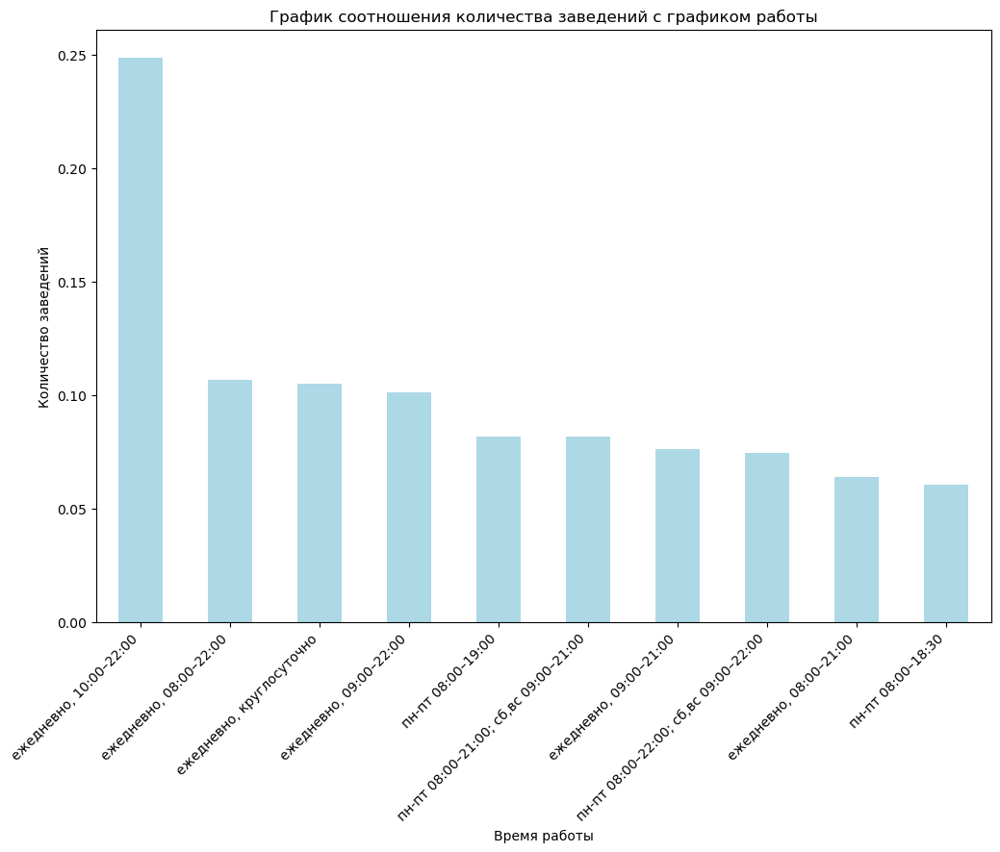

In [46]:
# найдем соотношение графика работы
part_institution = hours/hours.sum()

# отсортируем данные
part_cofee_house=part_cofee_house.sort_values(ascending=False)

# построим график распределения кофеен по популярности
plt.figure(figsize=(12, 8))
part_institution .plot(kind='bar', color='lightblue')
plt.title('График соотношения количества заведений с графиком работы')
plt.xlabel('Время работы')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.show()

С огромным отрывовом выбиваются кафе, которые работают ежедневно c 10:00 до 22:00. Можем предположить, что это удобно для клиентов и при открытии кофейни надо это учитывать.

3. На какое количество мест рассчитывать помещение.

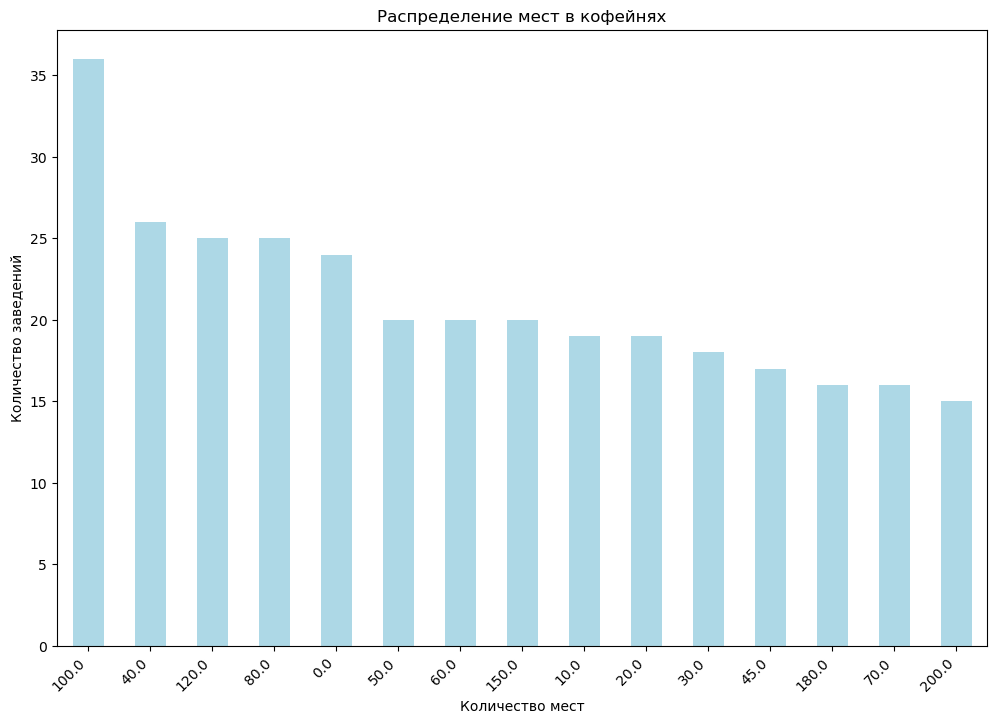

In [47]:
# смотрим распределение количества мест в кофейнях
seats = coffee_house_count['seats'].value_counts().head(15)

# отсортируем данные
seats=seats.sort_values(ascending=False)

# построим график количества мест в кофейнях
plt.figure(figsize=(12, 8))
seats.plot(kind='bar', color='lightblue')
plt.title('Распределение мест в кофейнях')
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')
plt.show()

Большинство кофеен имеет 100 мест. Чуть меньше - 40. Найдем медиану.

In [49]:
# удаляем нули и пропуски, затем считаем медиану
seats = coffee_house_count['seats'][coffee_house_count['seats'] != 0]
median_value = seats.median()  
rounded_median = round(median_value) 
rounded_median

80

80 - количество мест, на которое стоит ориентироваться при открытии кофейни.

## Шаг 5. Подготовка презентации

Презентация: <https://drive.google.com/file/d/1lA9ERi2YBFsGwvZHToBJfW_BAET5WkMx/view?usp=drive_link> 

### Вывод:

В ходе исследования была проделана следующая работа:
1. Изучилили общие данные и провели продобработку данных

2. Создали столбец с названием улиц и булевым значением работы кофеен

3. Определили категории заведений и отобразили их визуально.
Это помогло нам понять, что в Москве преобладают кафе.

4. Проанализировали и построили гарфик распределения посадочных мест в зависимости от типа заведения. 
По найденным данным делаем вывод, что меньше всего посадочных мест имеют булочные и пиццерии (около 50 - 60). Больше всего мест у баров/пабов и ресторанов (около 80-90). Скорее всего это обучловлено временем пребывания посетителей. В барах/пабах и ресторанах клиенты могут посидеть подольше, чем в булочных и пицериях.

5. Рассмотрели соотношение сетевых и несетевых заведений. 
Здесь определили лидерство несетевых заведений и распределение по категориям.

6. Нашли топ-15 популярных заведений в Москве.
Как видим на графике лидирует "Шоколадница". Остальные заведения не менее популярны и тоже пользуются спросом. Эти места объединяет быстрота обслуживания, разнообразное меню и хорошее соотношение цена/качество. Потребитель может как попить здесь чашечку кофе и быстро съесть ланч, так и посидеть с колегами или друзьями более длительное время. Эти параметры вполне могут объяснить популярность этих сетей. Исключение составляет Яндекс.Лавка, но она также может быть популярна из-за быстроты и разноообразия.

7. Отобразили общее количество заведений и количество заведений каждой категории по районам.
Согласно данным, наибольшее число заведений располагается в Центральном административном округе. Наименьшее число - в Северо-Западном округе.

8. Проанализировали распределение средних рейтингов по категориям заведений.
Видим, что у всех категорий средний уровень рейтинга примерно одинаковый. 

9. Изучили средние рейтинги по районам.
Все районы имеют примерно одинаковый рейтинг.

10. Кластерами отобразили все заведения на карте Москвы.

11. Определили топовые улицы по количеству заведений.
Лидирует Проспект Мира. 

12. Проанализировали средние чеки.
Самый дорогим районом по среднему чеку в заведениях оказался Центральный административный район. На втором месте стоит Западный округ.

13. Сделали общий вывод.

Следующим шагом мы  детализировали исследование открытия кофейни:

1. Нашли количество кофеен. Всего 1413.

2. Определили распределение по районам. 
Больше всего кофеен в Центральном районе. Видим, что распределение достаточно плотно, но есть места без кофеен в районе Гагаринского переулка и на окраинах Центрального округа. Это могут быть места, где открывать кофейню будет очень выгодно, так как конкуренция не такая высокая, либо, наоборот, кофейни в этих местах не пользуются популярностью.

3. Определили количество круглосуточных кофеен - 59. 

4. Выявили распределение рейтингов по райном Москвы.

5. Ответили на вопрос "На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?"
Самая дорогая средняя стоимость чашки в Западном округе - 190 руб, а самая низкая в Юго-Восточном - 151 руб. В зависимости от района, где будут открывать кофейню надо учитывать средние цены в этих районах.

6. Сделали рекомендации для открытия кофейни.
Наибольшее число кофеен в Центральном административном округе, здесь большая конкуренция и лучше рассмотреть другие округи.

С огромным отрывовом выбиваются кафе, которые работают ежедневно c 10:00 до 22:00. Можем предположить, что это удобно для клиентов и при открытии кофейни надо это учитывать.  

80 - количество мест, на которое стоит ориентироваться при открытии кофейни.